# Инициализация

Загружаем библиотеки необходимые для выполнения кода ноутбука.

In [1]:
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = "png"
%config InlineBackend.figure_format = "retina"

# === ЭТАП 1 ===

# Загрузка первичных данных

Загружаем первичные данные из файлов:
- tracks.parquet
- catalog_names.parquet
- interactions.parquet

In [3]:
tracks = pd.read_parquet("./ym/tracks.parquet")
catalog_names = pd.read_parquet("./ym/catalog_names.parquet")
interactions = pd.read_parquet("./ym/interactions.parquet")

In [4]:
print(f"Tracks:\n{tracks.head(2)}")
print("---")
print(f"Catalog_names:\n{catalog_names.head(2)}")
print("---")
print(f"Interactions:\n{interactions.head(2)}")

Tracks:
   track_id        albums artists    genres
0        26  [3, 2490753]    [16]  [11, 21]
1        38  [3, 2490753]    [16]  [11, 21]
---
Catalog_names:
   id   type               name
0   3  album    Taller Children
1  12  album  Wild Young Hearts
---
Interactions:
   user_id  track_id  track_seq started_at
0        0     99262          1 2022-07-17
1        0    589498          2 2022-07-19


# Обзор данных

Проверяем данные, есть ли с ними явные проблемы.

In [5]:
# Проверка пропусков
tracks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 4 columns):
 #   Column    Non-Null Count    Dtype 
---  ------    --------------    ----- 
 0   track_id  1000000 non-null  int64 
 1   albums    1000000 non-null  object
 2   artists   1000000 non-null  object
 3   genres    1000000 non-null  object
dtypes: int64(1), object(3)
memory usage: 30.5+ MB


In [ ]:
# Проверка на дубликаты
len(tracks) - tracks["track_id"].nunique()

0

In [7]:
# Проверка пропусков
catalog_names.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1812471 entries, 0 to 1812470
Data columns (total 3 columns):
 #   Column  Dtype 
---  ------  ----- 
 0   id      int64 
 1   type    object
 2   name    object
dtypes: int64(1), object(2)
memory usage: 41.5+ MB


In [8]:
# Проверим что храниться в type
catalog_names["type"].value_counts()

type
track     1000000
album      658724
artist     153581
genre         166
Name: count, dtype: int64

In [9]:
# Названия
track_names = catalog_names[catalog_names["type"] == "track"].set_index("id")["name"]
album_names = catalog_names[catalog_names["type"] == "album"].set_index("id")["name"]
artist_names = catalog_names[catalog_names["type"] == "artist"].set_index("id")["name"]
genre_names = catalog_names[catalog_names["type"] == "genre"].set_index("id")["name"]

In [ ]:
# Удалим из track данные, которых нет в catalog_names
track_ids = set(track_names.index)
album_ids = set(album_names.index)
artist_ids = set(artist_names.index)
genre_ids = set(genre_names.index)

def filter_valid_ids(ids, valid_ids):
    return [id for id in ids if id in valid_ids]

tracks = tracks[tracks["track_id"].isin(track_ids)]
tracks["albums"] = tracks["albums"].apply(lambda x: filter_valid_ids(x, album_ids))
tracks["artists"] = tracks["artists"].apply(lambda x: filter_valid_ids(x, artist_ids))
tracks["genres"] = tracks["genres"].apply(lambda x: filter_valid_ids(x, genre_ids))

In [ ]:
# Удалим строки с пустыми данными
mask = (tracks["albums"].str.len() > 0) & (tracks["artists"].str.len() > 0) & (tracks["genres"].str.len() > 0)

tracks = tracks[mask]
track_ids = set(tracks["track_id"])

tracks.info()

<class 'pandas.core.frame.DataFrame'>
Index: 980970 entries, 0 to 999999
Data columns (total 4 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   track_id  980970 non-null  int64 
 1   albums    980970 non-null  object
 2   artists   980970 non-null  object
 3   genres    980970 non-null  object
dtypes: int64(1), object(3)
memory usage: 37.4+ MB


In [12]:
# Проверка на дубликаты
len(catalog_names) - catalog_names["id"].nunique()

35774

In [13]:
# Посмотрим есть ли дубликаты для одинаковых type
duplicated_rows = catalog_names[catalog_names.duplicated(subset=["id", "type"], keep=False)]
print(duplicated_rows.sort_values(["id", "type"]))

Empty DataFrame
Columns: [id, type, name]
Index: []


In [14]:
# Посмотрим есть ли одинаковые name в пределах одного type
name_counts = catalog_names.groupby(["type", "name"]).size().reset_index(name="count")
duplicate_names = name_counts[name_counts["count"] > 1]
duplicate_names.groupby("type").size().reset_index(name="duplicate_name_count")

,type,duplicate_name_count
0,album,80410
1,artist,1807
2,track,120788


In [15]:
# Проверка пропусков
interactions.info()

<class 'pandas.core.frame.DataFrame'>
Index: 222629898 entries, 0 to 291
Data columns (total 4 columns):
 #   Column      Dtype         
---  ------      -----         
 0   user_id     int32         
 1   track_id    int32         
 2   track_seq   int16         
 3   started_at  datetime64[ns]
dtypes: datetime64[ns](1), int16(1), int32(2)
memory usage: 5.4 GB


In [ ]:
# Оставим данные только по имеющимся трекам
interactions = interactions[interactions["track_id"].isin(track_ids)]
interactions.info()

<class 'pandas.core.frame.DataFrame'>
Index: 222184325 entries, 0 to 291
Data columns (total 4 columns):
 #   Column      Dtype         
---  ------      -----         
 0   user_id     int32         
 1   track_id    int32         
 2   track_seq   int16         
 3   started_at  datetime64[ns]
dtypes: datetime64[ns](1), int16(1), int32(2)
memory usage: 5.4 GB


In [17]:
# Рассмотрим выбросы по track_seq
interactions["track_seq"].describe().apply(lambda x: f"{x:.2f}")

count    222184325.00
mean           462.00
std            824.81
min              1.00
25%             56.00
50%            181.00
75%            505.00
max          16637.00
Name: track_seq, dtype: object

In [18]:
# Удалим выбросы
interactions = interactions[interactions["track_seq"] <= 825].reset_index(drop=True)
interactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188504902 entries, 0 to 188504901
Data columns (total 4 columns):
 #   Column      Dtype         
---  ------      -----         
 0   user_id     int32         
 1   track_id    int32         
 2   track_seq   int16         
 3   started_at  datetime64[ns]
dtypes: datetime64[ns](1), int16(1), int32(2)
memory usage: 3.2 GB


In [19]:
# Рассмотрим выбросы по started_at
interactions["started_at"].describe()

count                        188504902
mean     2022-08-26 02:33:54.607121920
min                2022-01-01 00:00:00
25%                2022-06-26 00:00:00
50%                2022-09-11 00:00:00
75%                2022-11-07 00:00:00
max                2022-12-31 00:00:00
Name: started_at, dtype: object

# Выводы

Приведём выводы по первому знакомству с данными:
- есть ли с данными явные проблемы,
- какие корректирующие действия (в целом) были предприняты.

Проблемы с данными:
1. В данных о треках есть пустые списки по альбомам, артистам и/или жанрам.
2. В данных каталога есть одинаковые имена для альбомов, артистов и трэков.
3. Есть выбросы в взаимодействиях по номеру места трека в истории пользователя.

Корректирующие действия:
1. Данные с пустыми списками были исключены, так как не дают информации по рекомендациям.
2. Альбомы и треки могут называться одинаково у разных исполнителей, как и артисты могут иметь одинковое имя. Одинаковых жанров с разным id не найдено.
3. Были исключены выбросы по номеру места трека в истории пользователя по стандартному отклонению.

В данных по каталогу и взаимодействиям остались записи только по трекам из скорректированых данных по трекам.
После корректировок осталось 98% данных по трекам, 99% данных по каталогу, 85% данных по взаимодействию.

# === ЭТАП 2 ===

# EDA

Распределение количества прослушанных треков.

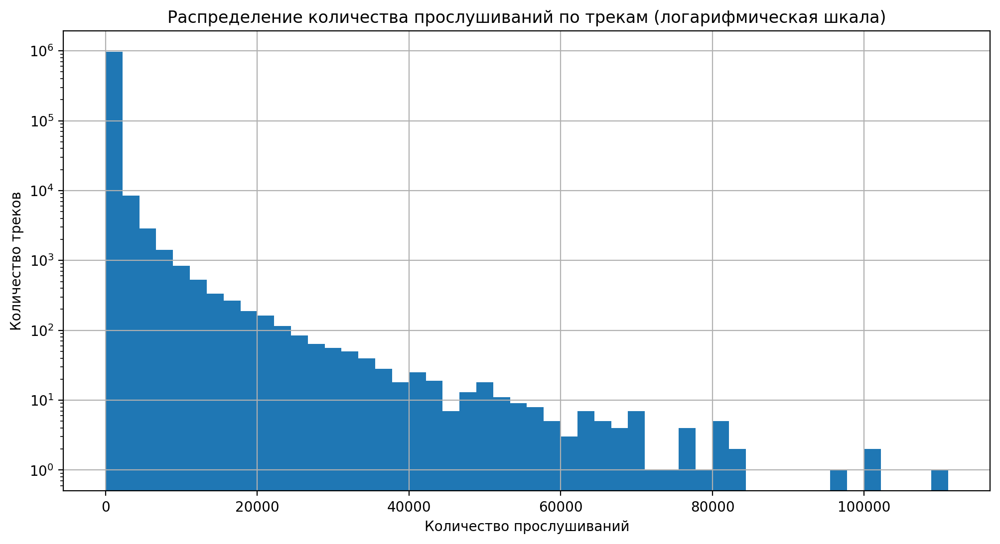

In [ ]:
# Распределение количества прослушиваний по трекам
track_popularity = interactions["track_id"].value_counts()
plt.figure(figsize=(12, 6))
track_popularity.hist(bins=50, log=True)
plt.title("Распределение количества прослушиваний по трекам (логарифмическая шкала)")
plt.xlabel("Количество прослушиваний")
plt.ylabel("Количество треков")
plt.show()

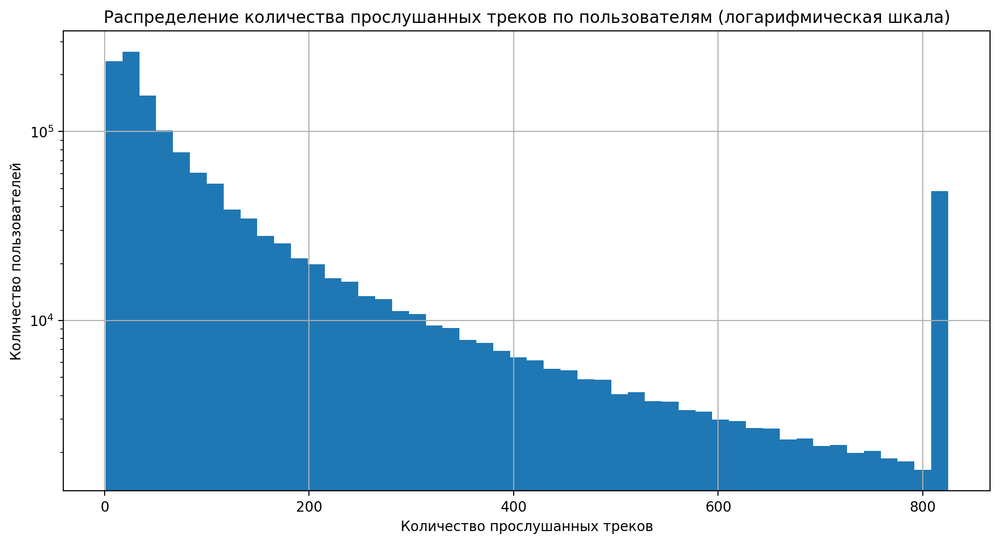

In [21]:
# Распределение количества прослушанных треков по пользователям
user_activity = interactions["user_id"].value_counts()
plt.figure(figsize=(12, 6))
user_activity.hist(bins=50, log=True)
plt.title("Распределение количества прослушанных треков по пользователям (логарифмическая шкала)")
plt.xlabel("Количество прослушанных треков")
plt.ylabel("Количество пользователей")
plt.show()

Наиболее популярные треки

In [ ]:
# Топ-10 самых популярных треков
top_tracks = (
    interactions[["track_id", "user_id"]]
    .groupby("track_id")
    .agg(unique_users=("user_id", "nunique")) 
    .nlargest(1000, "unique_users")
    .reset_index()
)

top_tracks["track_name"] = top_tracks["track_id"].map(track_names)

print("Топ-10 самых популярных треков:")
print(top_tracks[["track_id", "track_name"]].head(10))

Топ-10 самых популярных треков:
   track_id               track_name
0     53404  Smells Like Teen Spirit
1    178529                     Numb
2  33311009                 Believer
3  35505245               I Got Love
4    795836        Shape Of My Heart
5  24692821           Way Down We Go
6  32947997             Shape of You
7   6705392        Seven Nation Army
8  45499814                     Life
9     37384                   Zombie


Наиболее популярные жанры

In [ ]:
# Топ-10 самых популярных жанров
top_genres = (
    top_tracks[["track_id"]]
    .merge(tracks[["track_id", "genres"]], on="track_id")
    .explode("genres")
    .groupby("genres")
    .size()
    .nlargest(10)
    .reset_index(name="count")
)

top_genres["genre_name"] = top_genres["genres"].map(genre_names)

print("Топ-10 самых популярных жанров:")
print(top_genres[["genres", "genre_name"]])

Топ-10 самых популярных жанров:
   genres   genre_name
0      11          pop
1     102      allrock
2      75          rap
3      20       ruspop
4       3       rusrap
5      16        dance
6      14         rock
7       2      rusrock
8      68  electronics
9      44   foreignrap


Треки, которые никто не прослушал

In [ ]:
listened_tracks = set(interactions["track_id"])
unlistened_track_ids = track_ids - listened_tracks
unlistened_tracks = pd.DataFrame({
    "track_id": list(unlistened_track_ids),
    "track_name": [track_names[track_id] for track_id in unlistened_track_ids]
})

print(f"Треки, которые никто не прослушал:")
print(unlistened_tracks)

Треки, которые никто не прослушал:
      track_id         track_name
0     88088591      Пой, моя лира
1     15917072  Slay the Nazarene
2     59170838            merttva
3     72286250           Obsessed
4     76914760       Чёрный ветер
...        ...                ...
1537  44335054       Mexican Girl
1538  61038543        Jötunnheimr
1539  62218194          Soft Rock
1540  75259865   Чего же ты ждал?
1541  89907198           En Rogue

[1542 rows x 2 columns]


# Преобразование данных

Преобразуем данные в формат, более пригодный для дальнейшего использования в расчётах рекомендаций.

In [ ]:
items = tracks.explode("albums").explode("artists").explode("genres").reset_index(drop=True)
items = items.rename(columns={"track_id":"item_id","albums":"album_id","artists":"artist_id","genres":"genre_id"})

items["album_name"] = items["album_id"].map(album_names)
items["artist_name"] = items["artist_id"].map(artist_names)
items["genre_name"] = items["genre_id"].map(genre_names)

items = items.groupby("item_id").agg(
    {"album_id":lambda x: list(set(list(x))),
     "artist_id":lambda x: list(set(list(x))),
     "genre_id":lambda x: list(set(list(x))),
     "album_name":lambda x: list(set(list(x))),
     "artist_name":lambda x: list(set(list(x))),
     "genre_name":lambda x: list(set(list(x)))
     }).reset_index()

items["item_name"] = items["item_id"].map(track_names)
interactions['started_at'] = interactions['started_at'].dt.date

events = interactions.copy()
events = events.rename(columns={"track_id": "item_id"})

# Сохранение данных

Сохраним данные в двух файлах в персональном S3-бакете по пути `recsys/data/`:
- `items.parquet` — все данные о музыкальных треках,
- `events.parquet` — все данные о взаимодействиях.

In [26]:
items.to_parquet("items.parquet")
events.to_parquet("events.parquet")

In [27]:
import boto3
from dotenv import load_dotenv
import os

load_dotenv(override=True)

AWS_ACCESS_KEY_ID = os.environ['AWS_ACCESS_KEY_ID']
AWS_SECRET_ACCESS_KEY = os.environ['AWS_SECRET_ACCESS_KEY']
S3_BUCKET_NAME = os.environ['S3_BUCKET_NAME']

s3 = boto3.client(
    service_name='s3',
    endpoint_url='https://storage.yandexcloud.net',
    aws_access_key_id=AWS_ACCESS_KEY_ID,
    aws_secret_access_key=AWS_SECRET_ACCESS_KEY
)

# Загрузка файлов
files = {
    'items.parquet': 'recsys/data/items.parquet',
    'events.parquet': 'recsys/data/events.parquet'
}

for local_path, s3_path in files.items():
    try:
        s3.upload_file(local_path, S3_BUCKET_NAME, s3_path)
        s3.head_object(Bucket=S3_BUCKET_NAME, Key=s3_path)
        print(f"Файл {local_path} успешно загружен в {s3_path}")
    except Exception as e:
        print(f"Ошибка при загрузке {local_path}: {str(e)}")

Файл items.parquet успешно загружен в recsys/data/items.parquet
Файл events.parquet успешно загружен в recsys/data/events.parquet


# Очистка памяти

Здесь, может понадобится очистка памяти для высвобождения ресурсов для выполнения кода ниже. 

Приведите соответствующие код, комментарии, например:
- код для удаление более ненужных переменных,
- комментарий, что следует перезапустить kernel, выполнить такие-то начальные секции и продолжить с этапа 3.

In [28]:
del tracks, catalog_names, interactions
del track_names, album_names, artist_names, genre_names
del items, events

# === ЭТАП 3 ===

# Загрузка данных

Если необходимо, то загружаем items.parquet, events.parquet.

In [2]:
import numpy as np
import pandas as pd

In [3]:
items = pd.read_parquet("items.parquet")
events = pd.read_parquet("events.parquet")

# Разбиение данных

Разбиваем данные на тренировочную, тестовую выборки.

In [4]:
train_test_global_time_split_date = pd.to_datetime("2022-12-16").date()
train_test_global_time_split_idx = events["started_at"] < train_test_global_time_split_date

events_train = events[train_test_global_time_split_idx].reset_index(drop=True)
events_test = events[~train_test_global_time_split_idx].reset_index(drop=True)

In [5]:
# количество пользователей в train и test
users_train = events_train["user_id"].drop_duplicates()
users_test = events_test["user_id"].drop_duplicates()

common_users = set(users_train) & set(users_test)
cold_start_users = set(users_test) - set(users_train)

print(len(users_train), len(users_test), len(common_users), len(cold_start_users))

1342106 752490 721830 30660


# Топ популярных

Рассчитаем рекомендации как топ популярных.

In [6]:
# Добавим колонку track_seq_median с медианой номера места трека в истории пользователя
# Добавим колонку avg_rating с долей прослушиваний
item_popularity = (
    events_train
    .groupby("item_id")
    .agg(users=("user_id", "nunique"), track_seq_median=("track_seq", "median"))
    .sort_values(by=["users","track_seq_median"], ascending=[False,True])
    .reset_index()
)
item_popularity["avg_rating"] = round(1000*(item_popularity["users"]/item_popularity["users"].sum()),2)
item_popularity

,item_id,users,track_seq_median,avg_rating
0,53404,110026,8.0,0.62
1,178529,100838,18.0,0.57
2,33311009,95375,76.0,0.54
3,35505245,92556,51.0,0.52
4,795836,82967,37.0,0.47
...,...,...,...,...
976395,73646522,1,825.0,0.00
976396,75166959,1,825.0,0.00
976397,79673327,1,825.0,0.00
976398,87542035,1,825.0,0.00


In [7]:
# Добавим взвешенную популярность popularity_weighted как произведение кол-ва пользователей к медиане месте трека и доле прослушиваний
item_popularity["popularity_weighted"] = (item_popularity["users"] * item_popularity["track_seq_median"] * item_popularity["avg_rating"]) / 1000000
item_popularity["popularity_weighted"] = item_popularity["popularity_weighted"].apply(lambda x: round(x,2))
item_popularity

,item_id,users,track_seq_median,avg_rating,popularity_weighted
0,53404,110026,8.0,0.62,0.55
1,178529,100838,18.0,0.57,1.03
2,33311009,95375,76.0,0.54,3.91
3,35505245,92556,51.0,0.52,2.45
4,795836,82967,37.0,0.47,1.44
...,...,...,...,...,...
976395,73646522,1,825.0,0.00,0.00
976396,75166959,1,825.0,0.00,0.00
976397,79673327,1,825.0,0.00,0.00
976398,87542035,1,825.0,0.00,0.00


In [8]:
# Выбираем первые 100 треков по popularity_weighted
column_to_rank = "popularity_weighted"
top_popular = (
    item_popularity
    .sort_values(by=column_to_rank,ascending=False)
    .reset_index(drop=True)
    .head(100)
)
top_popular

,item_id,users,track_seq_median,avg_rating,popularity_weighted
0,33311009,95375,76.0,0.54,3.91
1,60292250,64869,157.0,0.37,3.77
2,51241318,71570,107.0,0.40,3.06
3,65851540,70088,103.0,0.40,2.89
4,50685843,58627,142.0,0.33,2.75
...,...,...,...,...,...
95,21133234,38407,106.0,0.22,0.90
96,43052381,46725,74.0,0.26,0.90
97,38633712,33705,139.0,0.19,0.89
98,1710810,47354,70.0,0.27,0.89


In [9]:
# Добавляем информацию о треках
top_popular = top_popular.merge(items[["item_id",'item_name','album_name','artist_name','genre_name']], on="item_id")
top_popular[["item_id", "users", "avg_rating", "popularity_weighted", 'item_name','album_name','artist_name','genre_name']].head(5)

,item_id,users,avg_rating,popularity_weighted,item_name,album_name,artist_name,genre_name
0,33311009,95375,0.54,3.91,Believer,"[Rock Motivation, Pop Band Bangers, Tailgate P...",[Imagine Dragons],"[rock, allrock]"
1,60292250,64869,0.37,3.77,Blinding Lights,"[Blinding Lights, The Highlights, After Hours]",[The Weeknd],[rnb]
2,51241318,71570,0.40,3.06,In The End,"[Winter Mix 2021, The Remixes, Christian TikTo...","[Tommee Profitt, Mellen Gi, Fleurie]",[rnb]
3,65851540,70088,0.40,2.89,Юность,[Юность],[Dabro],"[ruspop, pop]"
4,50685843,58627,0.33,2.75,Кукла колдуна,[Акустический альбом],[Король и Шут],[punk]


In [10]:
# Доля холодных пользователей
cold_users = events_test[events_test["user_id"].isin(cold_start_users)]["user_id"].drop_duplicates()
cold_users_events_with_recs = events_test[events_test["user_id"].isin(cold_users)].merge(top_popular, on="item_id", how="left")

print("Доля от пользователей в тесте: ", round(100*(len(cold_users)/len(users_test)),2), "%")
print("Доля от теста: ", round(100*(len(cold_users_events_with_recs)/len(events_test)),2), "%")

Доля от пользователей в тесте:  4.07 %
Доля от теста:  9.69 %


In [11]:
# Холодные пользователи, которые есть в топе
cold_user_recs = cold_users_events_with_recs.dropna(subset=top_popular.columns.difference(['item_id']))
print("Количество в топе: ", len(cold_users_events_with_recs))
print("Доля от топа: ", round(100*(len(cold_user_recs)/len(cold_users_events_with_recs)),2), "%")

Количество в топе:  1099199
Доля от топа:  5.25 %


In [12]:
print("Количество холодных пользователей:", len(cold_users))
print("Количество холодных пользователей в топе:", len(cold_user_recs["user_id"].drop_duplicates()))
print("Доля холодных пользователей в топе:",round(100*(len(cold_user_recs["user_id"].drop_duplicates())/len(cold_users)),2),"%")

Количество холодных пользователей: 30660
Количество холодных пользователей в топе: 16969
Доля холодных пользователей в топе: 55.35 %


In [13]:
cold_user_recs.loc[:, "popularity_weighted_user"] = round(
    (cold_user_recs["users"] * cold_user_recs["track_seq"] * cold_user_recs["avg_rating"]) / 1000000,2)
cold_user_recs.head(5)

/tmp/ipykernel_24378/2992158086.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cold_user_recs.loc[:, "popularity_weighted_user"] = round(


,user_id,item_id,track_seq,started_at,users,track_seq_median,avg_rating,popularity_weighted,item_name,album_name,artist_name,genre_name,popularity_weighted_user
13,47,6679078,14,2022-12-27,55480.0,53.0,0.31,0.91,Intro,[xx],[The xx],[indie],0.24
56,83,57921154,8,2022-12-27,63210.0,94.0,0.36,2.14,Комета,[Комета],[JONY],"[ruspop, pop]",0.18
99,171,54400255,23,2022-12-30,41628.0,107.0,0.23,1.02,Señorita,"[Music Anthems : For My Girlfriend, Happy Pop ...","[Camila Cabello, Shawn Mendes]",[pop],0.22
114,175,50834580,12,2022-12-26,51255.0,75.0,0.29,1.11,Девочка-война,"[ZHARA Vol.1, Девочка-война]",[HammAli & Navai],"[rap, rusrap]",0.18
140,440,2758009,9,2022-12-26,74802.0,61.0,0.42,1.92,The Show Must Go On,"[Bohemian Rhapsody, Innuendo, Greatest Hits In...",[Queen],"[rock, allrock, films, soundtrack]",0.28


In [14]:
# посчитаем метрики рекомендаций rmse и mae для полученных рекомендаций
from sklearn.metrics import mean_squared_error, mean_absolute_error

rmse = mean_squared_error(cold_user_recs["popularity_weighted_user"], cold_user_recs["popularity_weighted"], squared=False)
mae = mean_absolute_error(cold_user_recs["popularity_weighted_user"], cold_user_recs["popularity_weighted"])
print("rmse: ",round(rmse, 2))
print("mae: ",round(mae, 2))

rmse:  1.36
mae:  1.2


In [15]:
# посчитаем метрики rmse и mae по месту трека в истории track_seq
rmse = mean_squared_error(cold_user_recs["track_seq"], cold_user_recs["popularity_weighted_user"], squared=False)
mae = mean_absolute_error(cold_user_recs["track_seq"], cold_user_recs["popularity_weighted_user"])
print("rmse: ",round(rmse, 2))
print("mae: ",round(mae, 2))

rmse:  35.83
mae:  26.8


In [16]:
# посчитаем покрытие холодных пользователей рекомендациями
cold_users_hit_ratio = cold_users_events_with_recs.groupby("user_id").agg(hits=("popularity_weighted", lambda x: (~x.isnull()).mean()))

print(f"Доля пользователей без релевантных рекомендаций: {(cold_users_hit_ratio == 0).mean().iat[0]:.2f}")
print(f"Среднее покрытие пользователей: {cold_users_hit_ratio[cold_users_hit_ratio != 0].mean().iat[0]:.2f}")

Доля пользователей без релевантных рекомендаций: 0.45
Среднее покрытие пользователей: 0.10


In [17]:
del items, events
del cold_users_events_with_recs, cold_user_recs, cold_users_hit_ratio

In [18]:
top_popular.to_parquet("top_popular.parquet")
del top_popular

In [19]:
events_test = events_test.merge(item_popularity[['item_id', 'popularity_weighted']],on="item_id",how="left")
events_test.to_parquet("events_test.parquet")
del events_test

In [20]:
events_train = events_train.merge(item_popularity[['item_id', 'popularity_weighted']],on="item_id",how="left")
events_train.to_parquet("events_train.parquet")
del events_train

In [21]:
import boto3
from dotenv import load_dotenv
import os

load_dotenv(override=True)

AWS_ACCESS_KEY_ID = os.environ['AWS_ACCESS_KEY_ID']
AWS_SECRET_ACCESS_KEY = os.environ['AWS_SECRET_ACCESS_KEY']
S3_BUCKET_NAME = os.environ['S3_BUCKET_NAME']

s3 = boto3.client(
    service_name='s3',
    endpoint_url='https://storage.yandexcloud.net',
    aws_access_key_id=AWS_ACCESS_KEY_ID,
    aws_secret_access_key=AWS_SECRET_ACCESS_KEY
)

# Загрузка файлов
files = {
    'top_popular.parquet': 'recsys/recommendations/top_popular.parquet'
}

for local_path, s3_path in files.items():
    try:
        s3.upload_file(local_path, S3_BUCKET_NAME, s3_path)
        s3.head_object(Bucket=S3_BUCKET_NAME, Key=s3_path)
        print(f"Файл {local_path} успешно загружен в {s3_path}")
    except Exception as e:
        print(f"Ошибка при загрузке {local_path}: {str(e)}")

Файл top_popular.parquet успешно загружен в recsys/recommendations/top_popular.parquet


# Персональные

Рассчитаем персональные рекомендации.

In [1]:
import pandas as pd
import sklearn.preprocessing
import scipy
import numpy as np
import sys
from implicit.als import AlternatingLeastSquares

/home/mle-user/mle_projects/mle-project-sprint-4-v001/env_recsys_start/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Перед загрузкой перезапустить kernel
items = pd.read_parquet("items.parquet")
events = pd.read_parquet("events.parquet")

events_train = pd.read_parquet("events_train.parquet")
events_test = pd.read_parquet("events_test.parquet")

In [3]:
# перекодируем идентификаторы пользователей в последовательность
user_encoder = sklearn.preprocessing.LabelEncoder()
user_encoder.fit(events["user_id"])
events_train["user_id_enc"] = user_encoder.transform(events_train["user_id"])
events_test["user_id_enc"] = user_encoder.transform(events_test["user_id"])

# перекодируем идентификаторы объектов в последовательность
item_encoder = sklearn.preprocessing.LabelEncoder()
item_encoder.fit(items["item_id"])
items["item_id_enc"] = item_encoder.transform(items["item_id"])

events_train["item_id_enc"] = item_encoder.transform(events_train["item_id"])
events_test["item_id_enc"] = item_encoder.transform(events_test["item_id"])

In [10]:
# создаём sparse-матрицу формата CSR 
user_item_matrix_train = scipy.sparse.csr_matrix((
    events_train["popularity_weighted"],
    (events_train['user_id_enc'], events_train['item_id_enc'])),
    dtype=np.int8)

In [5]:
print(f"Матрица занимает {round(sum([sys.getsizeof(i) for i in user_item_matrix_train.data])/1024**3, 2)}Гб места")

Матрица занимает 4.12Гб места


In [ ]:
# создадим ALS-модель. Для примера возьмём количество латентных факторов для матриц $P, Q$, равным 50. 
als_model = AlternatingLeastSquares(factors=50, iterations=50, regularization=0.05, random_state=0)
als_model.fit(user_item_matrix_train)
als_model.save("als_model")

In [4]:
als_model = AlternatingLeastSquares(factors=50, iterations=50, regularization=0.05, random_state=0)
als_model = als_model.load("als_model.npz")

/home/mle-user/mle_projects/mle-project-sprint-4-v001/env_recsys_start/lib/python3.10/site-packages/implicit/cpu/als.py:95: RuntimeWarning: OpenBLAS is configured to use 4 threads. It is highly recommended to disable its internal threadpool by setting the environment variable 'OPENBLAS_NUM_THREADS=1' or by calling 'threadpoolctl.threadpool_limits(1, "blas")'. Having OpenBLAS use a threadpool can lead to severe performance issues here.
  check_blas_config()


In [7]:
def get_recommendations_als(user_item_matrix, model, user_id, user_encoder, item_encoder, include_seen=True, n=5):
    """
    Возвращает отранжированные рекомендации для заданного пользователя
    """
    user_id_enc = user_encoder.transform([user_id])[0]
    recommendations = model.recommend(
         user_id_enc, 
         user_item_matrix[user_id_enc], 
         filter_already_liked_items=not include_seen,
         N=n)
    recommendations = pd.DataFrame({"item_id_enc": recommendations[0], "score": recommendations[1]})
    recommendations["item_id"] = item_encoder.inverse_transform(recommendations["item_id_enc"])
    
    return recommendations

In [8]:
events_train[events_train['user_id']==57].head(5)

,user_id,item_id,track_seq,started_at,popularity_weighted,user_id_enc,item_id_enc
6634,57,17328,1,2022-10-06,0.00,57,3187
6635,57,31617,2,2022-10-06,0.01,57,5606
6636,57,128958,3,2022-10-08,0.04,57,22230
6637,57,149961,4,2022-10-17,0.15,57,24097
6638,57,628432,5,2022-10-22,0.20,57,64153


In [11]:
# Пример рекомендации
get_recommendations_als(user_item_matrix_train, als_model, 57, user_encoder, item_encoder, include_seen=True, n=15)

,item_id_enc,score,item_id
0,481764,1.342738e-13,33311009
1,568866,1.202944e-13,39257277
2,502501,4.864084e-14,34976783
3,736892,3.171217e-14,56204557
4,425849,2.436447e-14,29611476
5,500151,2.284671e-14,34735046
6,749843,1.831647e-14,57921154
7,489970,1.655422e-14,33977439
8,78870,1.550372e-14,694683
9,395929,1.434704e-14,27032843


In [15]:
# получаем список всех возможных user_id (перекодированных)
#user_ids_encoded = range(len(user_encoder.classes_))
user_ids_encoded = range(10000) #не успевает посчитаться ^^^

# получаем рекомендации для всех пользователей
als_recommendations = als_model.recommend(
    user_ids_encoded, 
    user_item_matrix_train[user_ids_encoded], 
    filter_already_liked_items=False, N=100)

# преобразуем полученные рекомендации в табличный формат
item_ids_enc = als_recommendations[0]
als_scores = als_recommendations[1]

als_recommendations = pd.DataFrame({
    "user_id_enc": user_ids_encoded,
    "item_id_enc": item_ids_enc.tolist(), 
    "score": als_scores.tolist()})

als_recommendations = als_recommendations.explode(["item_id_enc", "score"], ignore_index=True)

# приводим типы данных
als_recommendations["item_id_enc"] = als_recommendations["item_id_enc"].astype("int")
als_recommendations["score"] = als_recommendations["score"].astype("float")

# получаем изначальные идентификаторы
als_recommendations["user_id"] = user_encoder.inverse_transform(als_recommendations["user_id_enc"])
als_recommendations["item_id"] = item_encoder.inverse_transform(als_recommendations["item_id_enc"])

als_recommendations = als_recommendations.drop(columns=["user_id_enc", "item_id_enc"])
als_recommendations = als_recommendations[["user_id", "item_id", "score"]]

In [16]:
als_recommendations.head(5)

,user_id,item_id,score
0,0,33311009,9.317781e-14
1,0,39257277,5.572750e-14
2,0,34976783,4.720505e-14
3,0,29611476,3.537948e-14
4,0,34735046,2.836829e-14


In [17]:
# сохраняем
als_recommendations.to_parquet("personal_als.parquet")

In [18]:
import boto3
from dotenv import load_dotenv
import os

load_dotenv(override=True)

AWS_ACCESS_KEY_ID = os.environ['AWS_ACCESS_KEY_ID']
AWS_SECRET_ACCESS_KEY = os.environ['AWS_SECRET_ACCESS_KEY']
S3_BUCKET_NAME = os.environ['S3_BUCKET_NAME']

s3 = boto3.client(
    service_name='s3',
    endpoint_url='https://storage.yandexcloud.net',
    aws_access_key_id=AWS_ACCESS_KEY_ID,
    aws_secret_access_key=AWS_SECRET_ACCESS_KEY
)

# Загрузка файлов
files = {
    'personal_als.parquet': 'recsys/recommendations/personal_als.parquet'
}

for local_path, s3_path in files.items():
    try:
        s3.upload_file(local_path, S3_BUCKET_NAME, s3_path)
        s3.head_object(Bucket=S3_BUCKET_NAME, Key=s3_path)
        print(f"Файл {local_path} успешно загружен в {s3_path}")
    except Exception as e:
        print(f"Ошибка при загрузке {local_path}: {str(e)}")

Файл personal_als.parquet успешно загружен в recsys/recommendations/personal_als.parquet


In [21]:
als_recommendations = (
    als_recommendations
    .merge(events_test[["user_id", "item_id", "popularity_weighted"]]
               .rename(columns={"popularity_weighted": "popularity_weighted_test"}), 
           on=["user_id", "item_id"], how="left")
)

In [22]:
# подсчитаем метрику NDCG
import sklearn.metrics

def compute_ndcg(rating: pd.Series, score: pd.Series, k):
    if len(rating) < 2:
        return np.nan
    ndcg = sklearn.metrics.ndcg_score(np.asarray([rating.to_numpy()]), np.asarray([score.to_numpy()]), k=k)
    return ndcg

In [23]:
# посчитаем метрику NDCG для k=5 для всех пользователей из тестовой выборки
rating_test_idx = ~als_recommendations["popularity_weighted_test"].isnull()
ndcg_at_5_scores = als_recommendations[rating_test_idx].groupby("user_id").apply(lambda x: compute_ndcg(x["popularity_weighted_test"], x["score"], k=5))
print(ndcg_at_5_scores.mean())
ndcg_at_5_scores.head()

0.9375533537017113


user_id
15    0.939546
23         NaN
25    0.961530
58         NaN
63         NaN
dtype: float64

In [19]:
events.to_parquet("events.parquet")
items.to_parquet("items.parquet")
events_train.to_parquet("events_train.parquet")
events_test.to_parquet("events_test.parquet")

# Похожие

Рассчитаем похожие, они позже пригодятся для онлайн-рекомендаций.

In [1]:
import pandas as pd
import sklearn.preprocessing
import scipy
import numpy as np
import sys
from implicit.als import AlternatingLeastSquares

/home/mle-user/mle_projects/mle-project-sprint-4-v001/env_recsys_start/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
items = pd.read_parquet("items.parquet")
events = pd.read_parquet("events.parquet")
events_train = pd.read_parquet("events_train.parquet")
events_test = pd.read_parquet("events_test.parquet")

als_recommendations = pd.read_parquet("personal_als.parquet")

In [5]:
als_model = AlternatingLeastSquares(factors=50, iterations=50, regularization=0.05, random_state=0)
als_model = als_model.load("als_model.npz")

/home/mle-user/mle_projects/mle-project-sprint-4-v001/env_recsys_start/lib/python3.10/site-packages/implicit/cpu/als.py:95: RuntimeWarning: OpenBLAS is configured to use 4 threads. It is highly recommended to disable its internal threadpool by setting the environment variable 'OPENBLAS_NUM_THREADS=1' or by calling 'threadpoolctl.threadpool_limits(1, "blas")'. Having OpenBLAS use a threadpool can lead to severe performance issues here.
  check_blas_config()


In [6]:
similar_items = als_model.similar_items(events_train[events_train["item_id"]==10327926]["item_id_enc"].to_list()[0],N=10)
similar_items_id = similar_items[0].tolist()
similar_items_score = similar_items[1].tolist()
similar_items_df = pd.DataFrame({"item_id_enc": similar_items_id,"score": similar_items_score})
similar_items_df = similar_items_df.merge(items, on="item_id_enc",how="left")[["artist_name","genre_name","item_name"]]
similar_items_df

,artist_name,genre_name,item_name
0,[Иван Дорн],[dance],Бигуди
1,[Евгений Осин],"[estrada, rusestrada]",Живое море
2,[Édith Piaf],[estrada],"Non, Je Ne Regrette Rien"
3,[КИНО],"[rusrock, allrock]",Мама Анархия
4,[БумеR],[shanson],Не люби её
5,[Andy James],"[metal, progmetal]",Bullet in the Head
6,[Lifelover],[metal],Mitt annexia
7,[Nathan Furst],"[films, soundtrack]",Lighthouse
8,[Miracle of Sound],[alternative],Cries of a Dead World
9,[MATXX],"[rap, rusrap]",Tambur Gang


In [7]:
user_id_random = 15

# Получаем топ-10 треков
user_id_random_df = events_train[events_train["user_id_enc"] == user_id_random] \
    .sort_values(by="popularity_weighted", ascending=False)[["item_id", "item_id_enc"]].head(10)

# Добавляем информацию о треках
user_id_random_df = user_id_random_df.merge(items, on="item_id", how="left")[[
    "item_id", "item_name", "album_name", "artist_name", "genre_name"
]]

# Получаем топ-3 похожих пользователя
similar_users = als_model.similar_users(user_id_random, N=3)
similar_users_id = similar_users[0].tolist()
similar_users_score = similar_users[1].tolist()

# Треки, которые слушали похожие пользователи
user_similar_df = pd.DataFrame(columns=["user_id", "item_name", "artist_name", "genre_name"])

# Для каждого похожего пользователя — берём топ-10 его треков
for i in similar_users_id:
    user_similar_df_i = events_train[events_train["user_id_enc"] == i] \
        .sort_values(by="popularity_weighted", ascending=False)[["user_id", "item_id"]].head(10)
    
    user_similar_df = pd.concat([
        user_similar_df,
        user_similar_df_i.merge(items, on="item_id", how="left")[["user_id", "item_name", "artist_name", "genre_name"]]
    ])

# Показываем первые 30 треков, которые слушали похожие пользователи
user_similar_df.head(30)

,user_id,item_name,artist_name,genre_name
0,15,Gangsta's Paradise,"[L.V., Coolio]","[rap, foreignrap]"
1,15,I Know What You Want,"[Busta Rhymes, Mariah Carey]","[rap, foreignrap]"
2,15,I Will Survive,[Gloria Gaynor],"[disco, pop]"
3,15,Позови меня тихо по имени,[Любэ],"[estrada, rusestrada]"
4,15,На дискотеку!..,"[Султан-Ураган, Мурат Тхагалегов]","[caucasian, folk]"
0,1000081,"Another Brick In The Wall, Pt. 2",[Pink Floyd],"[prog, allrock]"
1,1000081,Свобода,"[Кипелов, Сергей Шнуров]","[rusrock, allrock]"
2,1000081,Skyfall,[Adele],[pop]
3,1000081,Stolen Dance,[Milky Chance],[indie]
4,1000081,Attention,[Charlie Puth],[pop]


In [8]:
# В качестве контентных признаков для рекомендаций используем жанры и исполнителей
def get_genres(items):    
    genres_counter = {}
    
    for _, row in items.iterrows():
        genres_names = row["genre_name"]
        if genres_names is None:
            continue
        
        for genre in genres_names:
            if genre in genres_counter:
                genres_counter[genre] += 1
            else:
                genres_counter[genre] = 1
    
    genres = pd.Series(genres_counter, name="votes").to_frame()
    genres = genres.reset_index().rename(columns={"index": "name"})    
    return genres

# Получаем жанры
genres = get_genres(items)

# Вычисляем относительный вес (частоту) каждого жанра
genres["score"] = genres["votes"] / genres["votes"].sum()

# Сортируем жанры по убыванию частоты
genres = genres.sort_values(by="score", ascending=False)
genres.head(5)

,name,votes,score
1,pop,166284,0.106413
19,rap,128212,0.082049
2,allrock,118506,0.075837
10,electronics,114232,0.073102
7,metal,72311,0.046275


In [9]:
# Считаем частоту появления каждого исполнителя в датасете
def get_artists(items):    
    artists_counter = {}

    for _, row in items.iterrows():
        artists_names = row["artist_name"]
        if artists_names is None:
            continue

        for artist in artists_names:
            if artist in artists_counter:
                artists_counter[artist] += 1
            else:
                artists_counter[artist] = 1

    artists = pd.Series(artists_counter, name="votes").to_frame()
    artists = artists.reset_index().rename(columns={"index": "name"})    
    return artists

# Получаем таблицу с артистами
artists = get_artists(items)

# Считаем относительный вес (долю) для каждого исполнителя
artists["score"] = artists["votes"] / artists["votes"].sum()

# Сортируем исполнителей по популярности
artists = artists.sort_values(by="score", ascending=False)
artists.head(5)

,name,votes,score
7153,Владимир Высоцкий,2038,0.001618
916,сборник,1377,0.001093
7494,Armin van Buuren,1273,0.001011
187,Wolfgang Amadeus Mozart,1203,0.000955
1145,Johann Sebastian Bach,1116,0.000886


In [10]:
# Построим матрицу, отражающую распределение жанров для всех треков.
# Каждая строка — это один трек, каждая колонка — жанр. 
# Значения — взвешенное участие жанра в треке (по числу упоминаний жанра в датасете).
def get_item2genre_matrix(genres, items):
    genre_names_to_id = genres.reset_index().set_index("name")["index"].to_dict()
    genre_names_to_votes = genres.reset_index().set_index("name")["votes"].to_dict()

    genres_csr_data = []
    genres_csr_row_idx = []
    genres_csr_col_idx = []

    for item_idx, row in items.iterrows():
        if row["genre_name"] is None:
            continue
        for genre_name in row["genre_name"]:
            genre_idx = genre_names_to_id[genre_name]
            genres_csr_data.append(genre_names_to_votes[genre_name])
            genres_csr_row_idx.append(item_idx)
            genres_csr_col_idx.append(genre_idx)

    # Создаём CSR-матрицу: строки — треки, столбцы — жанры, значения — "вес" жанра
    genres_csr = scipy.sparse.csr_matrix(
        (genres_csr_data, (genres_csr_row_idx, genres_csr_col_idx)),
        shape=(len(items), len(genres))
    )

    # Нормализуем строки матрицы, чтобы сумма весов по жанрам для трека была равна 1
    genres_csr = sklearn.preprocessing.normalize(genres_csr, norm='l1', axis=1)

    return genres_csr

# Получаем жанровый профиль для всех треков, отсортированных по ID
items = items.sort_values(by="item_id_enc")
all_items_genres_csr = get_item2genre_matrix(genres, items)

In [11]:
# Получим распределение предпочтений по жанрам
user_id = 15

user_events = events_train.query("user_id == @user_id")[["item_id", "popularity_weighted"]]
user_items = items[items["item_id"].isin(user_events["item_id"])].reset_index(drop=True)
user_items_genres_csr = get_item2genre_matrix(genres, user_items)

user_ratings = user_events["popularity_weighted"].to_numpy()
user_ratings = np.expand_dims(user_ratings, axis=1)

# Получаем взвешенное распределение жанров с учётом пользовательских оценок
user_items_genres_weighted = user_items_genres_csr.multiply(user_ratings)
# Вычисляем среднюю склонность пользователя к каждому жанру
user_genres_scores = np.asarray(user_items_genres_weighted.mean(axis=0))

# Создаём таблицу жанров с соответствующими пользовательскими оценками
user_genres = genres.copy()
user_genres["score"] = np.ravel(user_genres_scores)
user_genres = user_genres[user_genres["score"] > 0].sort_values(by="score", ascending=False)

# Показываем топ-5 жанров, наиболее интересных пользователю
user_genres.head(5)

,name,votes,score
9,jazz,19947,0.066837
19,rap,128212,0.031312
71,shanson,18366,0.031163
1,pop,166284,0.015969
11,rnb,15854,0.012615


In [12]:
# Вычисляем косинусное сходство между вектором жанровых предпочтений пользователя и жанровыми профилями всех треков
from sklearn.metrics.pairwise import cosine_similarity

similarity_scores = cosine_similarity(all_items_genres_csr, user_genres_scores)
similarity_scores = similarity_scores.flatten()
len(similarity_scores)

980970

In [13]:
# получаем индексы индексы треков по убыванию их score
k = 10
content_recs_df = pd.DataFrame(columns=["rec_track_id_enc","rec_score"])
top_k_indices = np.argsort(similarity_scores)[::-1].tolist()[:k]
top_k_scores = np.sort(similarity_scores)[::-1].tolist()[:k]
content_recs_df["rec_track_id_enc"] = top_k_indices
content_recs_df["rec_score"] = top_k_scores
content_recs_df

,rec_track_id_enc,rec_score
0,421829,0.906029
1,421822,0.906029
2,421828,0.906029
3,421819,0.906029
4,799176,0.905715
5,163721,0.905715
6,315723,0.905711
7,315724,0.905711
8,535696,0.905685
9,627646,0.904974


In [14]:
# Формируем финальный список контентных рекомендаций:
# отбираем треки, попавшие в топ по косинусному сходству
selected_items = items[items["item_id_enc"].isin(top_k_indices)]
selected_items[["item_id", "item_id_enc", "artist_name", "item_name", "genre_name"]].head(5)

,item_id,item_id_enc,artist_name,item_name,genre_name
163721,4277917,163721,[Youssoupha],La foule,"[rap, foreignrap, folk]"
315723,20574850,315723,"[Maverick Sabre, Idris Elba]",So Many People,"[rap, foreignrap, folk, african]"
315724,20574851,315724,"[Maverick Sabre, Idris Elba]",Home,"[rap, foreignrap, folk, african]"
421819,29232332,421819,"[Shot, Karen Туз, Аркадий Думикян]",О Тебе Мои Мысли,"[rap, foreignrap, caucasian, folk]"
421822,29232335,421822,"[Karen Туз, Аркадий Думикян]",Сирота,"[rap, foreignrap, caucasian, folk]"


In [15]:
# Функция для получения контентных рекомендаций для одного пользователя
from tqdm import tqdm

def get_content_recs_for_user(user_id, events, items, all_items_genres_csr, k=100):
    user_events = events.loc[events['user_id'] == user_id][["item_id", "popularity_weighted"]]

    user_items = items[items["item_id"].isin(user_events["item_id"])].reset_index(drop=True)
    user_items_genres_csr = get_item2genre_matrix(genres, user_items)

    user_ratings = user_events["popularity_weighted"].to_numpy()
    user_ratings = np.expand_dims(user_ratings, axis=1)

    user_items_genres_weighted = user_items_genres_csr.multiply(user_ratings)
    user_genres_scores = np.asarray(user_items_genres_weighted.mean(axis=0))
    user_genres_scores = [pd.Series(np.ravel(user_genres_scores)).fillna(0).tolist()]
    
    similarity_scores = cosine_similarity(all_items_genres_csr, user_genres_scores).flatten()

    top_k_indices = np.argsort(similarity_scores)[::-1].tolist()[:k]
    top_k_scores = np.sort(similarity_scores)[::-1].tolist()[:k]
    
    return top_k_indices, top_k_scores


# Получаем список уникальных пользователей
user_ids = events["user_id"].drop_duplicates().to_list()
print(f"Всего пользователей: {len(user_ids)}")

# Формируем словарь рекомендаций для каждого пользователя
d = {}
for user_id_i in tqdm(user_ids[:1000]):
    try:
        top_k_indices, top_k_scores = get_content_recs_for_user(user_id_i, events_train, items, all_items_genres_csr, k=100)
    except ValueError:
        continue
    d[user_id_i] = {"top_k_indices": top_k_indices, "top_k_scores": top_k_scores}

Всего пользователей: 1372766


100%|██████████| 1000/1000 [05:15<00:00,  3.17it/s]


In [16]:
# Получаем последний трек каждого пользователя по максимальному порядковому номеру прослушивания
users_last_track = (
    events.sort_values(["user_id", "track_seq"])
    .drop_duplicates("user_id", keep="last")
    [["user_id", "item_id", "track_seq"]]
)

users_last_track.head(5)

,user_id,item_id,track_seq
25,0,20497621,26
61,1,83436771,36
75,2,71650200,14
108,3,78194999,33
363,4,98766295,256


In [21]:
# Получаем все уникальные треки и их кодировки
unique_tracks = items[items["item_id"].isin(users_last_track["item_id"])][["item_id", "item_id_enc"]]
track_ids = unique_tracks["item_id"].unique()
print(f"Всего уникальных треков для рекомендаций: {len(track_ids)}")

# Создаем словарь для быстрого поиска кодировок
track_enc_dict = dict(zip(unique_tracks["item_id"], unique_tracks["item_id_enc"]))
enc_track_dict = dict(zip(unique_tracks["item_id_enc"], unique_tracks["item_id"]))

# Векторизованный поиск похожих треков
all_enc = [track_enc_dict[track] for track in track_ids]
similar_results = als_model.similar_items(all_enc, N=2)

Всего уникальных треков для рекомендаций: 186002


  0%|          | 0/186002 [00:00<?, ?it/s]


ValueError: too many values to unpack (expected 2)

In [37]:
# Собираем результаты
result_data = []
for i, track_id in enumerate(track_ids):
    # Получаем результаты для текущего трека
    similar_enc = similar_results[0][i]  # Массив похожих треков
    similar_scores = similar_results[1][i]  # Массив оценок
    
    # Берем первый похожий трек (индекс 1, так как 0 - сам трек)
    if len(similar_enc) > 1:  # Проверяем, что есть похожие треки
        try:
            sim_track_id = enc_track_dict.get(similar_enc[1], None)
            if sim_track_id is not None:
                result_data.append({
                    "item_id": track_id,
                    "sim_track_id": sim_track_id,
                    "sim_track_score": round(float(similar_scores[1]), 3)
                })
            else:
                print(f"Трек {similar_enc[1]} не найден в словаре (для item_id {track_id})")
        except Exception as e:
            print(f"Ошибка обработки для трека {track_id}: {str(e)}")

# Создаем DataFrame
similar_items_df = pd.DataFrame(result_data)
print(f"\nУспешно обработано рекомендаций: {len(similar_items_df)}")
similar_items_df.head(5)

Трек 37685 не найден в словаре (для item_id 553)
Трек 293049 не найден в словаре (для item_id 1163)
Трек 204648 не найден в словаре (для item_id 2010)
Трек 713747 не найден в словаре (для item_id 2325)
Трек 158837 не найден в словаре (для item_id 4576)
Трек 384829 не найден в словаре (для item_id 5401)
Трек 24000 не найден в словаре (для item_id 7786)
Трек 488243 не найден в словаре (для item_id 10354)
Трек 971662 не найден в словаре (для item_id 10381)
Трек 419928 не найден в словаре (для item_id 11752)
Трек 342090 не найден в словаре (для item_id 12507)
Трек 319230 не найден в словаре (для item_id 14287)
Трек 18459 не найден в словаре (для item_id 14604)
Трек 72863 не найден в словаре (для item_id 15529)
Трек 33964 не найден в словаре (для item_id 17329)
Трек 301689 не найден в словаре (для item_id 17335)
Трек 426109 не найден в словаре (для item_id 18441)
Трек 666901 не найден в словаре (для item_id 18676)
Трек 590319 не найден в словаре (для item_id 20873)
Трек 921105 не найден в с

,item_id,sim_track_id,sim_track_score
0,1729,35798071,0.998
1,3911,77123858,0.995
2,9654,70498860,1.000
3,15681,8339952,1.000
4,18705,633562,0.996


In [43]:
# Объединяем таблицу последних треков пользователей с рекомендациями похожих треков
similar = users_last_track.merge(similar_items_df, on="item_id", how="left")[
    ["user_id", "sim_track_id", "sim_track_score"]
].rename(columns={
    "sim_track_id": "item_id",
    "sim_track_score": "score"
}).dropna()

# Приводим типы столбцов к целочисленному и числу с плавающей точкой
similar["item_id"] = similar["item_id"].astype(int)
similar["score"] = similar["score"].astype(float)
similar.head(5)

,user_id,item_id,score
1,1,22977517,1.000
2,2,60161339,0.997
3,3,67155218,0.994
14,14,35358169,0.998
15,15,26291459,0.999


In [44]:
# сохраняем
similar.to_parquet("similar.parquet")

In [45]:
import boto3
from dotenv import load_dotenv
import os

load_dotenv(override=True)

AWS_ACCESS_KEY_ID = os.environ['AWS_ACCESS_KEY_ID']
AWS_SECRET_ACCESS_KEY = os.environ['AWS_SECRET_ACCESS_KEY']
S3_BUCKET_NAME = os.environ['S3_BUCKET_NAME']

s3 = boto3.client(
    service_name='s3',
    endpoint_url='https://storage.yandexcloud.net',
    aws_access_key_id=AWS_ACCESS_KEY_ID,
    aws_secret_access_key=AWS_SECRET_ACCESS_KEY
)

# Загрузка файлов
files = {
    'similar.parquet': 'recsys/recommendations/similar.parquet'
}

for local_path, s3_path in files.items():
    try:
        s3.upload_file(local_path, S3_BUCKET_NAME, s3_path)
        s3.head_object(Bucket=S3_BUCKET_NAME, Key=s3_path)
        print(f"Файл {local_path} успешно загружен в {s3_path}")
    except Exception as e:
        print(f"Ошибка при загрузке {local_path}: {str(e)}")

Файл similar.parquet успешно загружен в recsys/recommendations/similar.parquet


# Построение признаков

Построим три признака, можно больше, для ранжирующей модели.

In [1]:
import pandas as pd
import sklearn.preprocessing
import scipy
import numpy as np
import sys
from implicit.als import AlternatingLeastSquares

/home/mle-user/mle_projects/mle-project-sprint-4-v001/env_recsys_start/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
items = pd.read_parquet("items.parquet")
events = pd.read_parquet("events.parquet")
events_train = pd.read_parquet("events_train.parquet")
events_test = pd.read_parquet("events_test.parquet")

als_recommendations = pd.read_parquet("personal_als.parquet")
similar = pd.read_parquet("similar.parquet")

In [3]:
# Нормируем ALS score
als_recommendations["score"] = als_recommendations["score"] / als_recommendations["score"].max()

# Объединяем рекомендации ALS и similar по user_id и item_id
candidates = pd.merge(
    als_recommendations[["user_id", "item_id", "score"]].rename(columns={"score": "als_score"}),
    similar[["user_id", "item_id", "score"]].rename(columns={"score": "cnt_score"}),
    on=["user_id", "item_id"],
    how="outer"
)

print(f"Пересечений между двумя генераторами: {len(candidates)}")
candidates.to_parquet("candidates.parquet")

Пересечений между двумя генераторами: 1294819


In [ ]:
candidates = pd.read_parquet("candidates.parquet")

In [3]:
# Задаём точку разбиения
split_date_for_labels = pd.to_datetime("2022-12-24").date()
split_date_for_labels_idx = events_test["started_at"] < split_date_for_labels

# Формируем таргетный набор данных
events_labels = events_test[split_date_for_labels_idx].copy()
# Формируем новый тестовый набор
events_test_2 = events_test[~split_date_for_labels_idx].copy()

# количество пользователей в events_labels и events_test_2
print(events_labels["user_id"].nunique())
print(events_test_2["user_id"].nunique())

667941
546303


In [4]:
events_test_2.to_parquet("events_test_2.parquet")

In [5]:
# Добавляем колонку с таргетным значением для событий в events_labels:
# ставим 1 для тех треков, которые пользователь прослушал
events_labels["target"] = 1

In [6]:
# Объединяем таблицу кандидатов с таргетами из events_labels по user_id и item_id
candidates = candidates.merge(
    events_labels[["user_id", "item_id", "target"]],
    on=["user_id", "item_id"],
    how="left"
)
candidates["target"] = candidates["target"].fillna(0).astype("int")
candidates["target"].value_counts()

target
0    1293260
1       1559
Name: count, dtype: int64

In [7]:
# в кандидатах оставляем только тех пользователей, у которых есть хотя бы один положительный таргет
candidates_to_sample = candidates.groupby("user_id").filter(lambda x: x["target"].sum() > 0)
candidates_to_sample.head(5)

,user_id,item_id,als_score,cnt_score,target
1500,15,33311009,1.055699e-13,NaN,0
1501,15,32947997,4.770253e-14,NaN,0
1502,15,57921154,4.375647e-14,NaN,1
1503,15,47627256,3.261255e-14,NaN,0
1504,15,65851540,3.146496e-14,NaN,1


In [8]:
# Оставляем для каждого пользователя только 4 негативных примера вместе со всеми положительными
negatives_per_user = 4
candidates_for_train = pd.concat([
    candidates_to_sample.query("target == 1"),  # Все положительные примеры
    candidates_to_sample.query("target == 0")   # Отбираем по 4 отрицательных примера на пользователя
        .groupby("user_id")
        .apply(lambda grp: grp.sample(n=negatives_per_user, random_state=0))
])

candidates_for_train.reset_index(drop=True, inplace=True)
candidates_for_train["target"].value_counts()

target
0    2660
1    1559
Name: count, dtype: int64

In [2]:
def get_user_features(events):
    user_features = events.groupby("user_id").agg(
        using_months=("started_at_month", lambda x: (x.max()-x.min()+1)),
        tracks_used=("item_id","count"))
    
    user_features["tracks_per_month"] = user_features["tracks_used"] / user_features["using_months"]
    user_features["tracks_per_month"] = user_features["tracks_per_month"].apply(lambda x: round(x,3))
    return user_features

In [ ]:
# Добавим три признака на уровне пользователя:
# - using_months: количество месяцев активности пользователя в сервисе
# - tracks_used: общее число прослушанных треков
# - tracks_per_month: среднее количество треков в месяц

events_train["started_at_month"] = pd.to_datetime(events_train["started_at"]).dt.to_period('M').dt.to_timestamp().dt.month

# данные для обучения (events_train)
user_features_for_train = get_user_features(events_train)
candidates_for_train = candidates_for_train.merge(user_features_for_train, on="user_id", how="left")

candidates_for_train.to_parquet("candidates_for_train.parquet")

In [10]:
events_train.to_parquet("events_train.parquet")
events_labels.to_parquet("events_labels.parquet")
candidates.to_parquet("candidates.parquet")

In [3]:
events_train = pd.read_parquet("events_train.parquet")
events_labels = pd.read_parquet("events_labels.parquet")

In [4]:
# данные для инференса (events_train + events_labels)
events_inference = pd.concat([events_train, events_labels])
del events_train, events_labels

events_inference.to_parquet("events_inference.parquet")

In [3]:
candidates = pd.read_parquet("candidates.parquet")
events_inference = pd.read_parquet("events_inference.parquet")

In [4]:
candidates_to_rank = candidates[candidates["user_id"].isin(events_inference["user_id"].drop_duplicates())]

In [5]:
user_features_for_rank = get_user_features(events_inference)
candidates_to_rank = candidates_to_rank.merge(user_features_for_rank, on="user_id", how="left")

In [6]:
candidates_to_rank.to_parquet("candidates_to_rank.parquet")

# Ранжирование рекомендаций

Построим ранжирующую модель, чтобы сделать рекомендации более точными. Отранжируем рекомендации.

In [9]:
import pandas as pd
import sklearn.preprocessing
import scipy
import numpy as np
import sys
from implicit.als import AlternatingLeastSquares

In [9]:
candidates_for_train = pd.read_parquet("candidates_for_train.parquet")

In [10]:
from catboost import CatBoostClassifier, Pool

# Определяем список признаков и целевой столбец
features = [
    'als_score',
    'cnt_score',
    'using_months',
    'tracks_used',
    'tracks_per_month'
]
target = 'target'

# Формируем объект Pool для CatBoost, содержащий обучающие данные и метки
train_data = Pool(
    data=candidates_for_train[features], 
    label=candidates_for_train[target]
)

# Создаем и настраиваем классификатор CatBoost
cb_model = CatBoostClassifier(
    iterations=1000,
    learning_rate=0.1,
    depth=6,
    loss_function='Logloss',
    verbose=100,
    random_seed=0
)

# Запускаем обучение модели на тренировочных данных
cb_model.fit(train_data)

# Сохраняем обученную модель на диск
cb_model.save_model("cb_model")

0:	learn: 0.6079731	total: 74.5ms	remaining: 1m 14s
100:	learn: 0.3369385	total: 242ms	remaining: 2.15s
200:	learn: 0.2955385	total: 418ms	remaining: 1.66s
300:	learn: 0.2649022	total: 581ms	remaining: 1.35s
400:	learn: 0.2399211	total: 747ms	remaining: 1.12s
500:	learn: 0.2185841	total: 904ms	remaining: 900ms
600:	learn: 0.2017844	total: 1.07s	remaining: 710ms
700:	learn: 0.1861634	total: 1.23s	remaining: 523ms
800:	learn: 0.1727342	total: 1.39s	remaining: 346ms
900:	learn: 0.1614784	total: 1.57s	remaining: 173ms
999:	learn: 0.1510425	total: 1.76s	remaining: 0us


In [11]:
# Создаём Pool для данных инференса на основе признаков
inference_data = Pool(data=candidates_to_rank[features])

# Получаем вероятности положительного класса (рекомендации)
predictions = cb_model.predict_proba(inference_data)

# Добавляем в DataFrame новый столбец с оценками модели
candidates_to_rank["cb_score"] = predictions[:, 1]
candidates_to_rank.to_parquet("candidates_to_rank.parquet")
candidates_to_rank.head(5)

,user_id,item_id,als_score,cnt_score,target,using_months,tracks_used,tracks_per_month,cb_score
0,0,33311009,6.181302e-14,NaN,0,3.0,26,8.667,0.018843
1,0,39257277,3.696894e-14,NaN,0,3.0,26,8.667,0.039481
2,0,34976783,3.131525e-14,NaN,0,3.0,26,8.667,0.046521
3,0,29611476,2.347031e-14,NaN,0,3.0,26,8.667,0.027010
4,0,34735046,1.881917e-14,NaN,0,3.0,26,8.667,0.129865


In [12]:
candidates_to_rank = candidates_to_rank.sort_values(["user_id", "cb_score"], ascending=[True, False])
candidates_to_rank["rank"] = candidates_to_rank.groupby("user_id").cumcount() + 1

max_recommendations_per_user = 100
final_recommendations = candidates_to_rank.loc[candidates_to_rank["rank"] <= max_recommendations_per_user]
final_recommendations.to_parquet("recommendations.parquet")

In [13]:
import boto3
from dotenv import load_dotenv
import os

load_dotenv(override=True)

AWS_ACCESS_KEY_ID = os.environ['AWS_ACCESS_KEY_ID']
AWS_SECRET_ACCESS_KEY = os.environ['AWS_SECRET_ACCESS_KEY']
S3_BUCKET_NAME = os.environ['S3_BUCKET_NAME']

s3 = boto3.client(
    service_name='s3',
    endpoint_url='https://storage.yandexcloud.net',
    aws_access_key_id=AWS_ACCESS_KEY_ID,
    aws_secret_access_key=AWS_SECRET_ACCESS_KEY
)

# Загрузка файлов
files = {
    'recommendations.parquet': 'recsys/recommendations/recommendations.parquet'
}

for local_path, s3_path in files.items():
    try:
        s3.upload_file(local_path, S3_BUCKET_NAME, s3_path)
        s3.head_object(Bucket=S3_BUCKET_NAME, Key=s3_path)
        print(f"Файл {local_path} успешно загружен в {s3_path}")
    except Exception as e:
        print(f"Ошибка при загрузке {local_path}: {str(e)}")

Файл recommendations.parquet успешно загружен в recsys/recommendations/recommendations.parquet


# Оценка качества

Проверим оценку качества трёх типов рекомендаций: 

- топ популярных,
- персональных, полученных при помощи ALS,
- итоговых
  
по четырем метрикам: recall, precision, coverage, novelty.

In [2]:
import pandas as pd
import sklearn.preprocessing
import scipy
import numpy as np
import sys
from implicit.als import AlternatingLeastSquares

/home/mle-user/mle_projects/mle-project-sprint-4-v001/env_recsys_start/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
events_test_2 = pd.read_parquet("events_test_2.parquet")
events_inference = pd.read_parquet("events_inference.parquet")

In [4]:
test_users = events_test_2["user_id"].drop_duplicates()
events_inference = events_inference[events_inference["user_id"].isin(test_users)][["user_id", "item_id"]]

# Загружаем финальные рекомендации с оценками модели
final_recommendations = pd.read_parquet("recommendations.parquet")[["user_id", "item_id", "cb_score"]]

In [5]:
def process_events_recs_for_binary_metrics(events_train, events_test, recs, top_k=None):
    # Помечаем в тесте "ground truth" (gt) — что это реальные прослушивания
    events_test = events_test.copy()
    events_test["gt"] = True

    # Находим пользователей, общих для рекомендаций и теста
    common_users = set(events_test["user_id"]).intersection(recs["user_id"])
    print(f"Common users: {len(common_users)}")

    # Оставляем только данные по общим пользователям
    events_for_common_users = events_test[events_test["user_id"].isin(common_users)].copy()
    recs_for_common_users = recs[recs["user_id"].isin(common_users)].copy()

    # Сортируем рекомендации по убыванию score для каждого пользователя
    recs_for_common_users = recs_for_common_users.sort_values(["user_id", "score"], ascending=[True, False])

    # Фильтруем тестовые треки, оставляя только те, что были в обучении
    valid_train_tracks = set(events_train["item_id"].unique())
    events_for_common_users = events_for_common_users[events_for_common_users["item_id"].isin(valid_train_tracks)]

    # Если указано top_k — оставляем только топ-k рекомендаций на пользователя
    if top_k is not None:
        recs_for_common_users = recs_for_common_users.groupby("user_id").head(top_k)

    # Объединяем GT и рекомендации по user_id и item_id, чтобы сопоставить предсказания и реальные данные
    merged = events_for_common_users[["user_id", "item_id", "gt"]].merge(
        recs_for_common_users[["user_id", "item_id", "score"]],
        on=["user_id", "item_id"],
        how="outer"
    )

    # Заполняем отсутствующие значения GT как False (не прослушано)
    merged["gt"] = merged["gt"].fillna(False)
    # Признак рекомендаций — true, если есть score, иначе false
    merged["pr"] = merged["score"].notnull()

    # Определяем True Positive, False Positive и False Negative
    merged["tp"] = merged["gt"] & merged["pr"]
    merged["fp"] = (~merged["gt"]) & merged["pr"]
    merged["fn"] = merged["gt"] & (~merged["pr"])

    return merged


def compute_cls_metrics(events_recs_for_binary_metric):
    group = events_recs_for_binary_metric.groupby("user_id")

    # precision = tp / (tp + fp)
    precision = group["tp"].sum() / (group["tp"].sum() + group["fp"].sum())
    precision = precision.fillna(0).mean()

    # recall = tp / (tp + fn)
    recall = group["tp"].sum() / (group["tp"].sum() + group["fn"].sum())
    recall = recall.fillna(0).mean()

    return precision, recall

In [6]:
cb_events_recs_for_binary_metrics_5 = process_events_recs_for_binary_metrics(
    events_inference,
    events_test_2,
    final_recommendations.rename(columns={"cb_score": "score"}), 
    top_k=5)

precision, recall = compute_cls_metrics(cb_events_recs_for_binary_metrics_5)
print(f"Precision@5: {precision:.4f}")
print(f"Recall@5: {recall:.4f}")

Common users: 118074
Precision@5: 0.0051
Recall@5: 0.0010


In [11]:
# Получаем важность признаков из модели CatBoost
feature_importance = pd.DataFrame({
    "feature": features,
    "importance": cb_model.get_feature_importance()
})

# Сортируем признаки по убыванию важности
feature_importance = feature_importance.sort_values(by="importance", ascending=False).reset_index(drop=True)
feature_importance

,feature,importance
0,als_score,49.337035
1,cnt_score,24.198301
2,tracks_used,12.256085
3,tracks_per_month,10.166610
4,using_months,4.041969


In [13]:
events_train = pd.read_parquet("events_train.parquet")

In [14]:
# Отмечаем треки, которые пользователь уже слушал (read=True)
events_train["read"] = True
final_recommendations = final_recommendations.merge(
    events_train[["user_id", "item_id", "read"]],
    on=["user_id", "item_id"],
    how="left"
)

# Заполняем пропуски False и приводим к булеву типу
final_recommendations["read"] = final_recommendations["read"].fillna(False).astype(bool)

# Сортируем рекомендации по убыванию оценки для каждого пользователя и присваиваем ранги
final_recommendations = final_recommendations.sort_values(
    by=["user_id", "cb_score"], ascending=[True, False]
)
final_recommendations["rank"] = final_recommendations.groupby("user_id").cumcount() + 1

# Рассчитываем novelty — долю рекомендаций, которые пользователь не слушал, в топ-5
novelty_per_user = 1 - final_recommendations.query("rank <= 5").groupby("user_id")["read"].mean()

# Среднее значение новизны по всем пользователям
avg_novelty = novelty_per_user.mean()
avg_novelty

0.9859475003245035

In [15]:
items = pd.read_parquet("items.parquet")

In [16]:
coverage = final_recommendations["item_id"].nunique() / items["item_id"].nunique()
print(f"Покрытие рекомендаций (coverage): {coverage:.4f}")

Покрытие рекомендаций (coverage): 0.0637


# === Выводы, метрики ===

Основные выводы при работе над расчётом рекомендаций, рассчитанные метрики.

#### Основные метрики качества

| Метрика            | Значение       |
|--------------------|---------------|
| Precision          | 0.0051        |
| Recall             | 0.0010        |
| Novelty            | 0.986         |
| Coverage           | 0.0637 (6.37%)|

#### Важность признаков в модели

| Ранг | Признак          | Важность (%) |
|------|------------------|-------------|
| 0    | als_score        | 49.34       |
| 1    | cnt_score        | 24.20       |
| 2    | tracks_used      | 12.26       |
| 3    | tracks_per_month | 10.17       |
| 4    | using_months     | 4.04        |

#### Метрики рекомендаций

**Качество предсказаний:**
- RMSE: 1.36
- MAE: 1.2

**Точность позиционирования треков:**
- RMSE по месту в истории: 35.83
- MAE по месту в истории: 26.8

#### Персональные рекомендации (ALS)

- **NDCG:** 0.938 (очень высокое качество ранжирования)
- Доля пользователей без релевантных рекомендаций: 45%
- Среднее покрытие пользователей: 10%

### Сохраненные артефакты
| Путь | Тип данных | Описание |
|------|------------|----------|
| `recsys/data/items.parquet` | Parquet | Полный каталог треков |
| `recsys/data/events.parquet` | Parquet | Данные о событиях прослушиваний |
| `recsys/recommendations/top_popular.parquet` | Parquet | Топ популярных треков |
| `recsys/recommendations/personal_als.parquet` | Parquet | Персональные рекомендации (ALS) |
| `recsys/recommendations/similar.parquet` | Parquet | Похожие треки |
| `recsys/recommendations/recommendations.parquet` | Parquet | Итоговые рекомендации |

**Выводы:**
1. Система демонстрирует:
   - Высокую новизну рекомендаций (98.6%)
   - Хорошее качество ранжирования (NDCG = 0.938)
   
2. Основные направления для улучшения:
   - Увеличение coverage (текущее 6.37%)
   - Снижение доли пользователей без релевантных рекомендаций (45%)
   - Оптимизация важности контентных рекомендаций (cnt_score = 24.2%)

3. Лучший признак: als_score (49.34% важности)